<a href="https://colab.research.google.com/github/ccandefigueroa/curso-piii/blob/main/clase09_14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

def generate_shepard_tone(base_freq, num_tones, duration, sample_rate):
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    tone = np.zeros_like(t)

    for i in range(num_tones):
        freq = base_freq * (2 ** i)
        amplitude = np.sin(np.pi * i / num_tones) ** 2
        tone += amplitude * np.sin(2 * np.pi * freq * t)

    return tone

# Parámetros
base_freq = 440  # Frecuencia base en Hz (Nota La)
num_tones = 6 # Número de tonos superpuestos
duration = 0.5   # Duración de cada tono en segundos
sample_rate = 44100  # Tasa de muestreo

# Generar el tono de Shepard
shepard_tone = generate_shepard_tone(base_freq, num_tones, duration, sample_rate)

# Reproducir el tono generado
Audio(shepard_tone, rate=sample_rate)

def generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps):
    scale = []
    for step in range(steps):
        tone = generate_shepard_tone(base_freq * (2 ** (step / steps)), num_tones, duration, sample_rate)
        scale.append(tone)
    return np.concatenate(scale)

# Parámetros adicionales
steps = 100  # Número de pasos en la escala (equivalente a una octava)

# Generar la escala de Shepard
shepard_scale = generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps)

# Reproducir la escala
Audio(shepard_scale, rate=sample_rate)

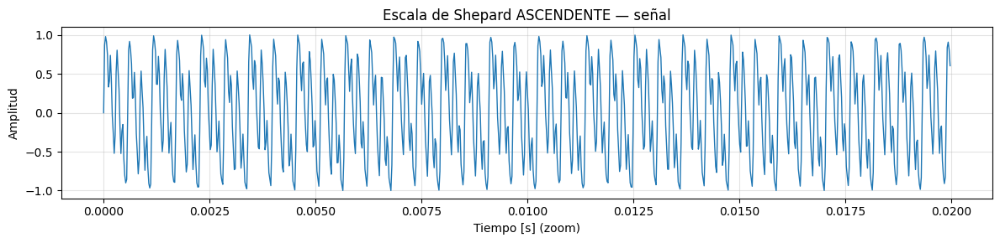

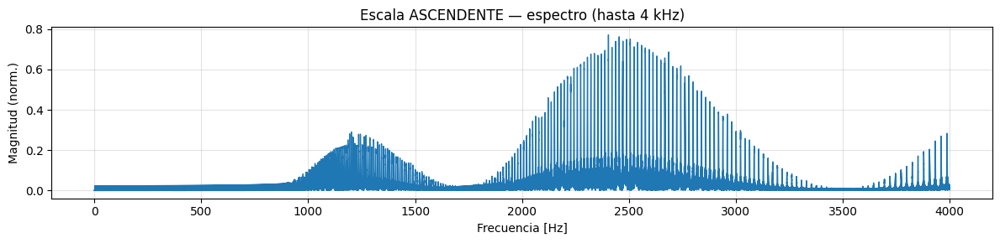

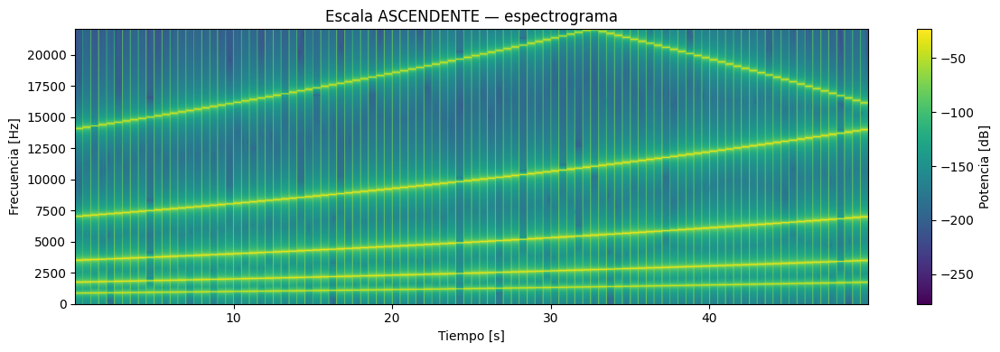

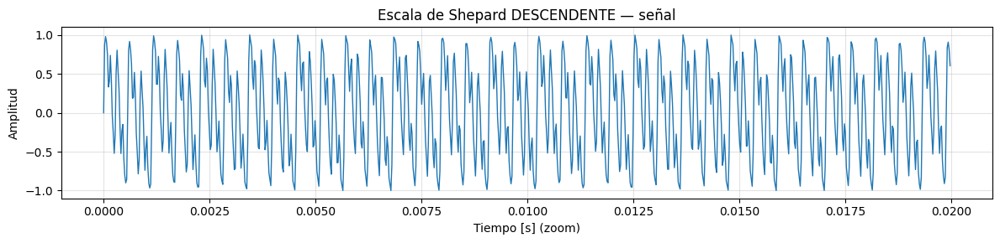

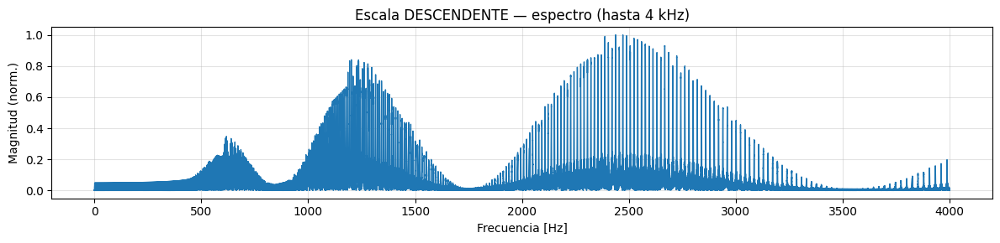

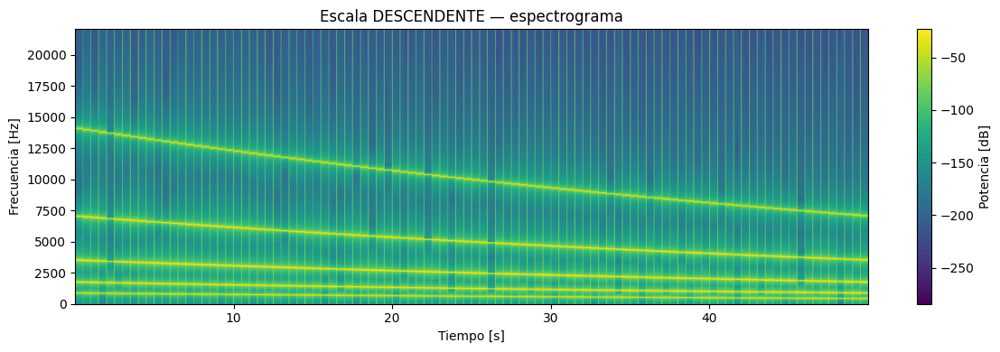

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

# ------------------ Núcleo: tono de Shepard ------------------
def generate_shepard_tone(base_freq, num_tones, duration, sample_rate):
    """
    Suma de senos en potencias de 2 de la frecuencia base,
    ponderados por una envolvente (sin^2) que hace que los
    extremos de octava se desvanezcan.
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    tone = np.zeros_like(t)

    for i in range(num_tones):
        freq = base_freq * (2 ** i)
        amplitude = np.sin(np.pi * i / num_tones) ** 2  # envolvente suave
        tone += amplitude * np.sin(2 * np.pi * freq * t)

    # normalizar para evitar clipping
    tone /= np.max(np.abs(tone) + 1e-12)
    return tone

# ------------------ Escalas: ascendente y descendente ------------------
def generate_shepard_scale_up(base_freq, num_tones, duration, sample_rate, steps):
    """
    Escala ascendente: en 'steps' pasos se recorre ~1 octava.
    """
    scale = []
    for step in range(steps):
        factor = 2 ** (step / steps)               # sube
        tone = generate_shepard_tone(base_freq * factor, num_tones, duration, sample_rate)
        scale.append(tone)
    scale = np.concatenate(scale)

    # normalizado global
    scale = scale / (np.max(np.abs(scale)) + 1e-12)
    return scale

def generate_shepard_scale_down(base_freq, num_tones, duration, sample_rate, steps):
    """
    Escala descendente: recorre ~1 octava hacia abajo.
    """
    scale = []
    for step in range(steps):
        factor = 2 ** (-step / steps)              # baja
        tone = generate_shepard_tone(base_freq * factor, num_tones, duration, sample_rate)
        scale.append(tone)
    scale = np.concatenate(scale)

    # normalizado global
    scale = scale / (np.max(np.abs(scale)) + 1e-12)
    return scale

# ------------------ Utilidades de análisis/gráfica ------------------
def plot_signal(x, fs, title="Señal en el tiempo", t_zoom=None):
    N = len(x)
    t = np.arange(N) / fs
    plt.figure(figsize=(12, 3))
    if t_zoom is None:
        plt.plot(t, x, linewidth=1.0)
        plt.xlabel("Tiempo [s]")
    else:
        i0 = int(t_zoom[0]*fs)
        i1 = int(t_zoom[1]*fs)
        plt.plot(t[i0:i1], x[i0:i1], linewidth=1.0)
        plt.xlabel("Tiempo [s] (zoom)")
    plt.ylabel("Amplitud")
    plt.title(title)
    plt.grid(True, alpha=0.35)
    plt.tight_layout()
    plt.show()

def plot_spectrum(x, fs, fmax=None, title="Espectro (FFT, magnitud normalizada)"):
    xw = x - np.mean(x)  # quita DC para que no tape el espectro
    N = len(xw)
    X = np.fft.rfft(xw * np.hanning(N))
    f = np.fft.rfftfreq(N, 1/fs)
    M = np.abs(X)
    M /= (np.max(M) + 1e-12)
    if fmax is not None:
        sel = f <= fmax
        f, M = f[sel], M[sel]
    plt.figure(figsize=(12, 3))
    plt.plot(f, M, linewidth=1.0)
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Magnitud (norm.)")
    plt.title(title)
    plt.grid(True, alpha=0.35)
    plt.tight_layout()
    plt.show()

def plot_spectrogram(x, fs, NFFT=2048, noverlap=1024, title="Espectrograma"):
    plt.figure(figsize=(12, 4))
    Pxx, freqs, bins, im = plt.specgram(
        x, NFFT=NFFT, Fs=fs, noverlap=noverlap, scale='dB'
    )
    plt.title(title)
    plt.xlabel("Tiempo [s]")
    plt.ylabel("Frecuencia [Hz]")
    plt.colorbar(label="Potencia [dB]")
    plt.tight_layout()
    plt.show()

# ------------------ Parámetros ------------------
base_freq   = 440      # Hz (La4)
num_tones   = 6        # tonos por octava
duration    = 0.5      # s por paso
sample_rate = 44100    # Hz
steps       = 100      # pasos por octava

# ------------------ Tono individual ------------------
shepard_tone = generate_shepard_tone(base_freq, num_tones, duration, sample_rate)
display(Audio(shepard_tone, rate=sample_rate))

# ------------------ Escala ascendente ------------------
shepard_up = generate_shepard_scale_up(base_freq, num_tones, duration, sample_rate, steps)
display(Audio(shepard_up, rate=sample_rate))

# Graficar ascendente (señal, espectro, espectrograma)
plot_signal(shepard_up, sample_rate, "Escala de Shepard ASCENDENTE — señal", t_zoom=(0, 0.02))
plot_spectrum(shepard_up, sample_rate, fmax=4000, title="Escala ASCENDENTE — espectro (hasta 4 kHz)")
plot_spectrogram(shepard_up, sample_rate, title="Escala ASCENDENTE — espectrograma")

# ------------------ Escala descendente ------------------
shepard_down = generate_shepard_scale_down(base_freq, num_tones, duration, sample_rate, steps)
display(Audio(shepard_down, rate=sample_rate))

# Graficar descendente (señal, espectro, espectrograma)
plot_signal(shepard_down, sample_rate, "Escala de Shepard DESCENDENTE — señal", t_zoom=(0, 0.02))
plot_spectrum(shepard_down, sample_rate, fmax=4000, title="Escala DESCENDENTE — espectro (hasta 4 kHz)")
plot_spectrogram(shepard_down, sample_rate, title="Escala DESCENDENTE — espectrograma")


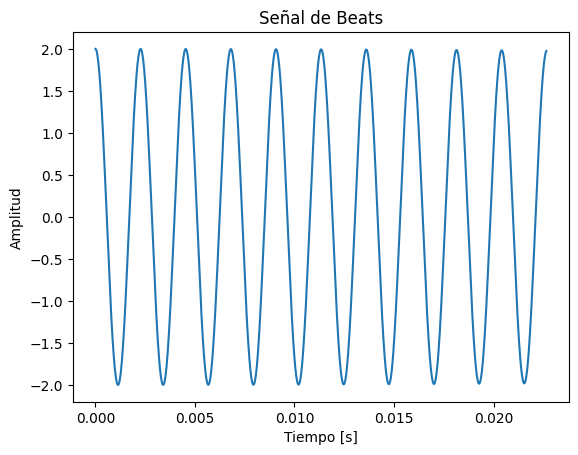

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

def generate_beats(freq1, freq2, duration, sample_rate):
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    signal1 = np.cos(2 * np.pi * freq1 * t)
    signal2 = np.cos(2 * np.pi * freq2 * t)
    beats = signal1 + signal2
    return t, beats

# Parámetros
freq1 = 440  # Frecuencia del primer tono en Hz (Nota La)
freq2 = 442  # Frecuencia del segundo tono en Hz
duration = 5.0  # Duración de la señal en segundos
sample_rate = 44100  # Tasa de muestreo

# Generar la señal de beats
t, beats_signal = generate_beats(freq1, freq2, duration, sample_rate)

# Visualizar la señal de beats
plt.plot(t[:1000], beats_signal[:1000])  # Visualización de un pequeño fragmento de la señal
plt.title('Señal de Beats')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.show()

# Reproducir la señal de beats
Audio(beats_signal, rate=sample_rate)